In [1]:
import numpy as np
import pandas as pd
import plotly
import os
import json
import requests
import plotly.graph_objects as go

# A history of trade-globalization

We all have heard about "globalization" and how it has changed the way we trade. Think about it, how much of the food you consume has been produced locally? Did people have acces to all these international products before? Have you ever seen your grandma (or grandpa) cooking this fancy thing called "quinoa" that flies from another country? Yes, GLOBALIZATION is a fact, but how is it really changing worldwide?

Do not be impatient, we are going to discover it! But, first of all...

**Has the production also increased over the past two decades?**


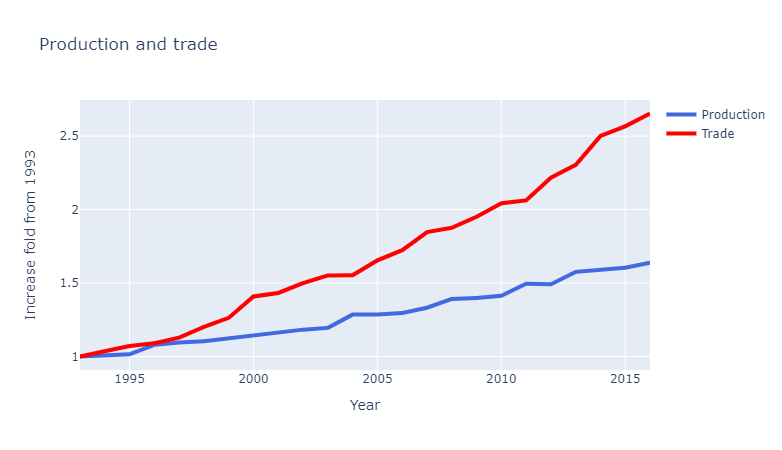

In [3]:
df_prod = pd.read_pickle("data/df_prod.pkl")
df_prod = df_prod.loc[df_prod['Element'] == 'Production'].drop(['Area','Item', 'Element', 'Unit'], axis = 1).dropna()
prod = np.array(df_prod).sum(axis = 0)
prod = prod/prod[0]

df_trade = pd.read_pickle('data/df_trade_merged.pkl')
df_trade = df_trade.drop(['Importer','Exporter', 'Item'], axis = 1).dropna()
trade = np.array(df_trade).sum(axis = 0)
trade = trade/trade[0]

import plotly.graph_objects as go
years = ['1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', \
'2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016'] 
fig = go.Figure()
fig.add_trace(go.Scatter(x=years, y=prod, mode='lines', name='Production', line = dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=years, y=trade, mode='lines', name='Trade', line = dict(color='red', width=4)))
fig.update_layout(title='Production and trade',
                   xaxis_title='Year',
                   yaxis_title='Increase fold from 1993')

As you may have predicted, production has almost double: we are more habitants, so it seems pretty obvious, right? But oh man was going on with the trade... We have almost tripled it! Let's look a little bit deeper to find the ambitious countries that are importing soooo much.

In [9]:
from helpme import plot_imports

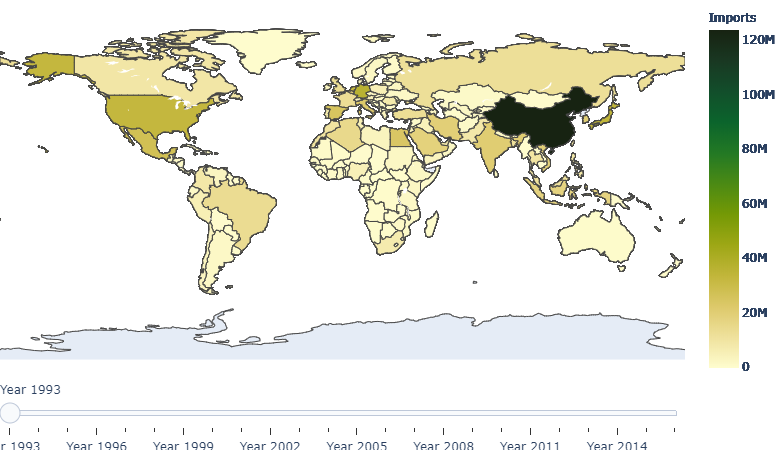

In [46]:
from PSLCOOLSS import plot_imports
plot_imports(cs = 'speed')

**From Japan to China!** In 1993 Japan was the country that had the most imports (in tonnes) compared to the rest of countries... but something has clearly changed: now China is the imports-Queen, but *Why?* Before answering, let's take a look to the exports...

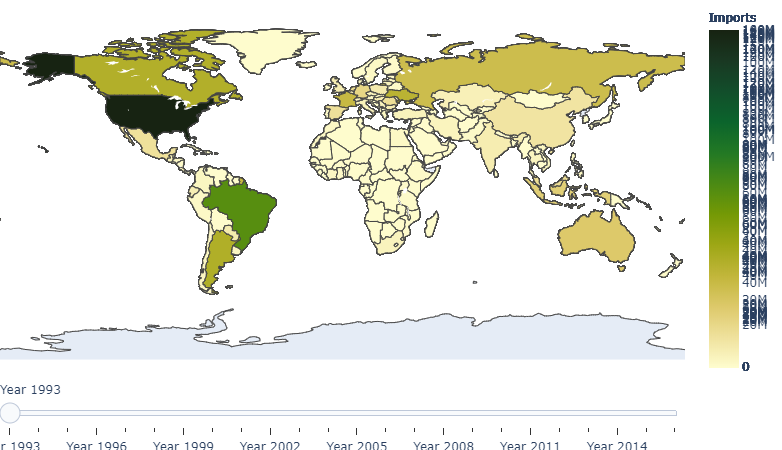

In [39]:
from psl import plot_exports
plot_exports(cs = 'speed')

The United States are still the king of exports, but one country seems to be increasingly joining the *let's export* trend: Brazil!

So we have seen changes in **China** and **Brazil**: any relationship within them? Let's analyze the main **trading routes** from 1993 to 2016

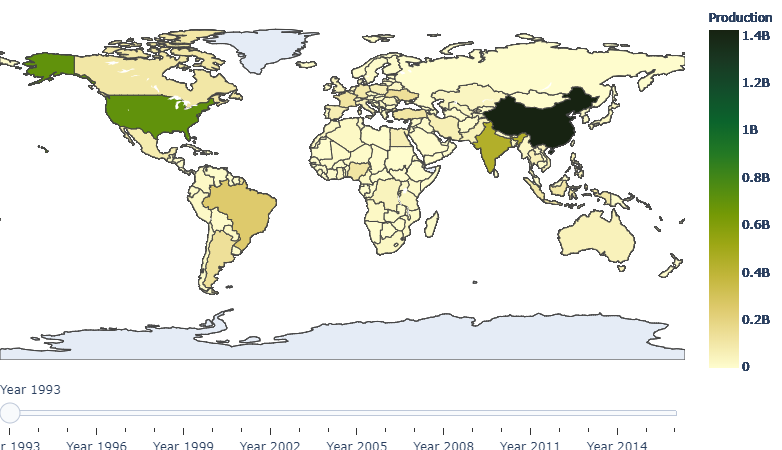

In [45]:
from PSLCOOLSS import plot_globaltrade
# Set Europe to true if you want to merge the EU countries.
plot_globaltrade(Europe = True, cs = 'speed', thick = 4)

Back to 1993, main trade line: U.S.-Japan, from the main exporter to the main importer by the time. But one line trade seems to become more and more important over the years: **Brazil-China!** So yes, it our new relevant exporter is trading a lot with the importer-Queen, but which kind of products? 

In [97]:
df_trade = pd.read_pickle('data/df_trade_merged.pkl')
trade_chbr = df_trade.loc[df_trade['Importer'] == 'China, mainland']
trade_chbr = trade_chbr.loc[df_trade['Exporter'] == 'Brazil']
trade_chbr = trade_chbr.sort_values(['2016'], ascending = False).reset_index()

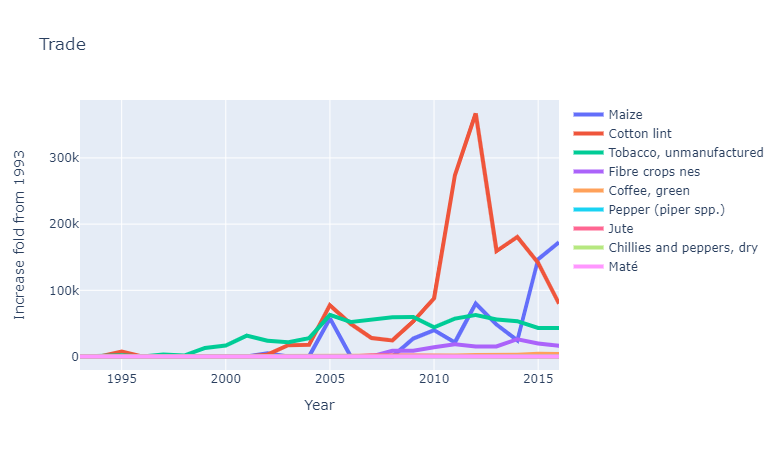

In [99]:
import plotly.graph_objects as go
years = ['1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', \
'2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016'] 
fig = go.Figure()
items = trade_chbr['Item']
for i in range(1, 10):
    fig.add_trace(go.Scatter(x=years, y= trade_chbr.iloc[i][years], mode='lines', name=items[i], line = dict(width=4)))
fig.update_layout(title='Trade ',
                   xaxis_title='Year',
                   yaxis_title='Increase fold from 1993')